# GeoCode GT Heat Map

In [420]:
import pandas as pd
import matplotlib.pyplot as plt #if using matplotlib
import plotly.express as px #if using plotly
import pyproj
import shapely
import geopandas as gpd
import geoplot
import geoplot.crs as gcrs
from matplotlib.gridspec import GridSpec
import numpy as np

In [421]:
def plot_grid_heat_map(df, list_of_variables, plot_titles, n_rows, n_cols, fig_length, fig_height, saved_file_name):
    # Set up figure with four axis
    f, axs = plt.subplots(n_rows, n_cols, figsize=(fig_length, fig_height))
    # Flatten the array of axis so you can loop over
    # in one dimension
    axs = axs.flatten()
    # Loop over each year
    for k, i, y in zip(plot_titles, range(len(list_of_variables)),list_of_variables):
        df.plot(column=y, cmap='Blues', linewidth=1, ax=axs[i], edgecolor='0.9', legend = True)

        # Remove axis
        axs[i].set_axis_off()
        # Name the subplot with the name of the column
        axs[i].set_title(k)
        axs[i].set_facecolor("white")
    # Tight layout to better use space
    plt.tight_layout()
    # Display figure
    fig1 = plt.gcf()
    plt.figure(facecolor='white')
    fig1.savefig(saved_file_name, facecolor=fig.get_facecolor(), edgecolor='none')
    plt.show()


In [422]:
def show_heat_map(column, df, title, legend_title):
    df[column]=(df[column]-df[column].mean())/(df[column].max() - df[column].min())
    fig = px.choropleth(df, geojson=df.geometry, 
                        locations=df.index, color=column,
                        height=500,
                       color_continuous_scale="Blues")
    fig.update_geos(fitbounds="locations", visible=True)
    fig.update_layout(
        title_text= title
    )
    fig.update(layout = dict(title=dict(x=0.5)))
    fig.update_layout(
        margin={"r":0,"t":30,"l":10,"b":10},
        coloraxis_colorbar={
            'title':legend_title})
    fig.show()

In [423]:
sh_data = gpd.read_file("NatDMA1.shp")

In [219]:
sh_data.Key = pd.to_numeric(sh_data.Key)

In [220]:
sh_data.head()

,Key,AFFGEOID,GEOID,NAME,AreaSqKm,AreaSqMi,CentroidX,CentroidY,LengthKm,LengthMi,NumParts,PeanoKey,ObjType,geometry
0,0,0100000US,US,National,9.366258e+06,3.616333e+06,-112.935156,45.699112,66355.811893,41231.589948,290,-61591239704847306,Polygon,"MULTIPOLYGON (((-179.06918 51.26287, -179.1268..."
1,500,NaN,NaN,Portland-Auburn ME,2.915956e+04,1.125857e+04,-70.571171,44.341957,4151.849611,2579.839743,769,-61567322892545262,Polygon,"MULTIPOLYGON (((-70.22944 43.53838, -70.22967 ..."
2,501,NaN,NaN,New York NY,3.052699e+04,1.178654e+04,-74.176949,41.116231,4792.535959,2977.943782,614,-61568174549266471,Polygon,"MULTIPOLYGON (((-74.09828 39.76064, -74.10907 ..."
3,502,NaN,NaN,Binghamton NY,9.335196e+03,3.604339e+03,-75.491063,42.260486,620.411103,385.505587,1,-61567724642116565,Polygon,"POLYGON ((-74.42828 42.34915, -74.53729 42.201..."
4,503,NaN,NaN,Macon GA,2.269162e+04,8.761282e+03,-83.332901,32.572126,895.422777,556.389919,2,-61577340522549115,Polygon,"POLYGON ((-82.39718 32.45138, -82.40914 32.353..."


In [221]:
df = pd.read_csv('final_data_2010_2019.csv').iloc[:,1:]

In [222]:
walkcross = pd.read_csv("dma_shp_to_dma_area_walk.csv")

In [223]:
df2 = df.merge(walkcross, on = 'DMA', how = 'left')

In [243]:
df3 = df2.merge(sh_data, left_on = 'dma_code', right_on = 'Key', how = 'left')

In [244]:
df3.columns

Index(['DMA', 'GT.MVT', 'GT.Burglary', 'GT.Larceny', 'GT.Rape', 'UCR.Rape',
       'UCR.Burglary', 'UCR.Larceny', 'UCR.MVT', 'UCR.Homicide', 'UCR.Assault',
       'UCR.Robbery', 'DMA.INDEX', 'Percentage.of.Foreign.Born',
       'Percentage.of.MoveIn', 'Percentage.of.Renter', 'Mobility.Index',
       'Concentrated.Disadvantage.Index', 'Percentage.of.Unemployed',
       'Percentage.of.Female.Headed.Households', 'Percentage.of.Poverty',
       'Heterogeneity.Index', 'Percentage.of.Young.Males',
       'Percentage.of.Dropped.Out', 'Percentage.of.Divorced',
       'Population.logged', 'Less.than.High.School', 'Percentage.of.White',
       'Percentage.of.Black', 'Percentage.of.Hispanic', 'Population',
       'Drug.Mortality.Rate', 'Law.Enforce.per.Thousand', 'Internet.Usage.HH',
       'Median.Vehicle.HH', 'dma_code', 'dma_name', 'latitude', 'longitude',
       'Key', 'AFFGEOID', 'GEOID', 'NAME', 'AreaSqKm', 'AreaSqMi', 'CentroidX',
       'CentroidY', 'LengthKm', 'LengthMi', 'NumParts', 'Pe

In [403]:
df4 = df3[['GT.Rape', 'GT.Larceny','GT.Burglary','UCR.Rape', 'UCR.Homicide', 'UCR.Robbery', 'UCR.Larceny', 'UCR.Burglary','UCR.MVT','GT.MVT','geometry', 'dma_code', 'DMA']]

In [404]:
df5 = df4.set_geometry("geometry").set_index("DMA")

In [405]:
plot_vio_vriables = ['GT.Rape', 'UCR.Rape', 'UCR.Homicide', 'UCR.Robbery']
plot_vio_titles = ['Rape GT', 'Rape UCR', 'Homicde UCR', 'Robbery UCR']

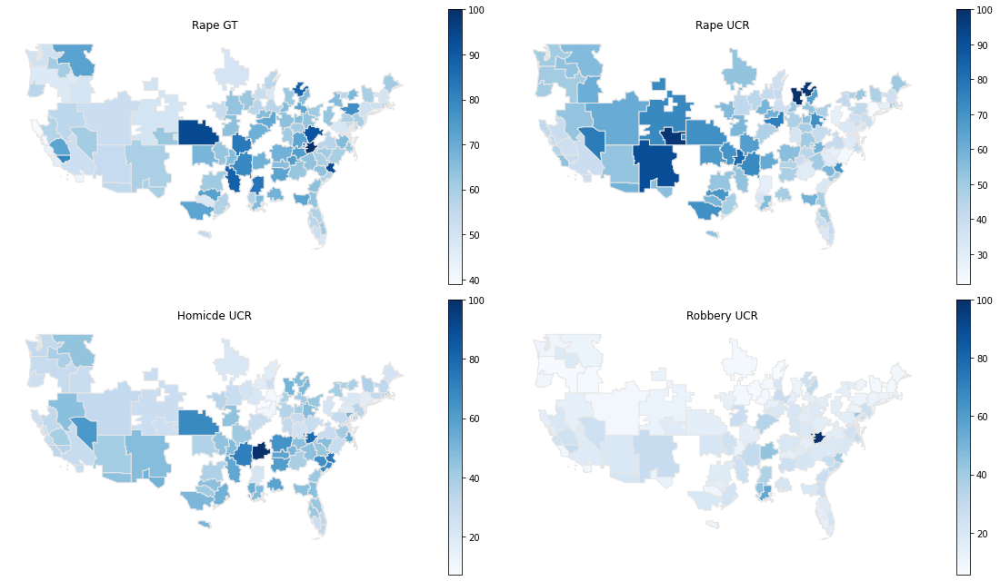

<Figure size 432x288 with 0 Axes>

In [407]:
plot_grid_heat_map(df5, plot_vio_vriables, plot_vio_titles, 2, 2, 16, 9,'vio_heatmap.png')

plt.close('all')

In [414]:
plot_property_variables = ['GT.MVT', 'UCR.MVT', 'GT.Burglary', 'UCR.Burglary', 'GT.Larceny','UCR.Larceny']
plot_property_titles = ['MVT GT', 'MVT UCR', 'Burlary GT', 'Burglary UCR', 'Larceny GT', 'Larceny UCR']

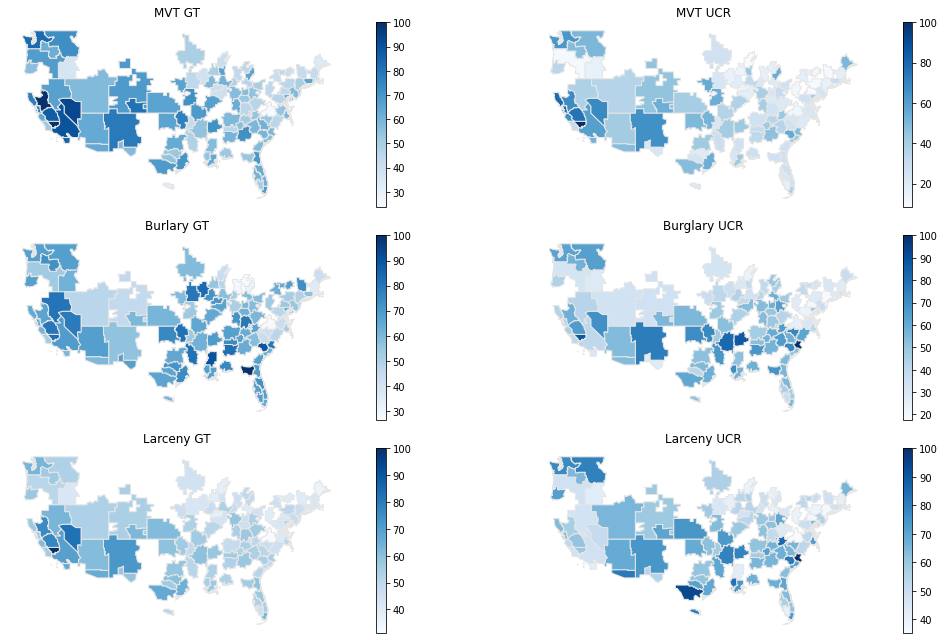

<Figure size 432x288 with 0 Axes>

In [416]:
plot_grid_heat_map(df5, plot_property_variables, plot_property_titles, 3, 2, 16, 9,'prop_heatmap.png')
plt.close('all')

# show_heat_map_func

In [291]:
show_heat_map('GT.Rape', df5, 'GT Rape Heat Map in DMA', 'GT Rape')

In [417]:
show_heat_map('UCR.Rape', df5, 'UCR Rape Heat Map in DMA', 'UCR Rape')

In [418]:
show_heat_map('UCR.Homicide', df5, 'UCR Homicide Heat Map in DMA', 'UCR Homicide')

In [419]:
show_heat_map('UCR.Robbery', df5, 'UCR Robbery Heat Map in DMA', 'UCR Robbery')